In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

### Czarne punkty na mapie to stacje z których są pobierane informacje

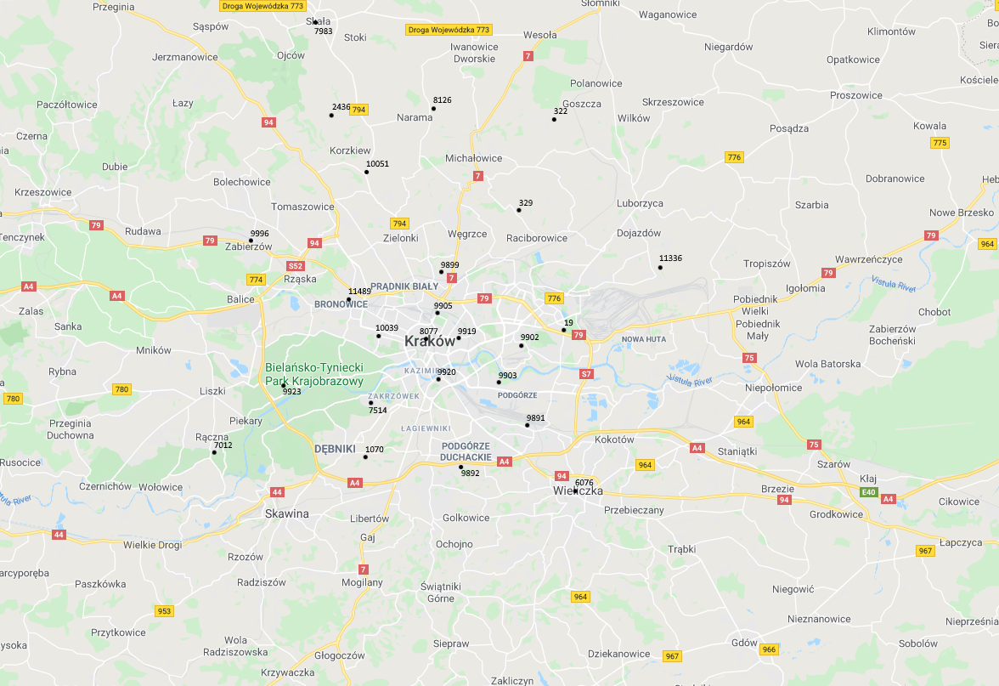

In [3]:
from IPython.display import Image
Image(filename='mapa_google.png') 
# TODO: oznaczyc kazda ze stacji jednym kolorem by byly zawsze takie same na wykresach

## Wczytanie danych z pliku csv

In [4]:
df = pd.read_csv('./measurements.csv', header = 0).iloc[:, 1:]
df = df.drop(columns=['indexLevel'])

## Wczytanie danych z prosto z bazy danych

In [68]:
import sqlalchemy
import pyodbc

fo = open('password.conf', 'r+')
password = fo.readline()
connection_string = 'Driver={ODBC Driver 13 for SQL Server};Server=tcp:airly-db-server.database.windows.net,1433;Database=AirlyDatabase;Uid=admin1;Pwd=%s;Encrypt=yes;TrustServerCertificate=no;Connection Timeout=30;' % (password)

cnxn = pyodbc.connect(connection_string)
df = pd.read_sql_query('select * from measurement', cnxn).iloc[:, 1:]

In [69]:
df['fromDataTime'] = df['fromDataTime'].apply(lambda x: pd.to_datetime(x))
df['tillDateTime'] = df['tillDateTime'].apply(lambda x: pd.to_datetime(x))

df

,installationId,fromDataTime,tillDateTime,PM1,PM25,PM10,PRESSURE,HUMIDITY,TEMPERATURE,indexValue,indexLevel,NO2,CO,CLOUDCOVER,WINDDIRECTION,WINDSPEED,dayOfWeek,coronavirus,typeOfDay
0,19,2020-03-06 15:00:00,2020-03-06 16:00:00,NaN,9.18,31.15,NaN,76.36,3.888889,31.15,LOW,65.31,440.75,59.7,110.54,10.3,Friday,False,Normal
1,19,2020-03-06 16:00:00,2020-03-06 17:00:00,NaN,11.90,35.42,NaN,76.36,3.888889,35.42,LOW,68.93,464.01,59.7,110.54,10.3,Friday,False,Normal
2,19,2020-03-06 17:00:00,2020-03-06 18:00:00,NaN,14.68,38.20,NaN,76.36,3.888889,38.20,LOW,70.74,528.15,59.7,110.54,10.3,Friday,False,Normal
3,19,2020-03-06 18:00:00,2020-03-06 19:00:00,NaN,13.06,32.74,NaN,76.36,3.888889,32.74,LOW,61.21,478.53,59.7,110.54,10.3,Friday,False,Normal
4,19,2020-03-06 19:00:00,2020-03-06 20:00:00,NaN,11.14,24.30,NaN,76.36,3.888889,24.30,VERY_LOW,34.67,392.50,59.7,110.54,10.3,Friday,False,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10741,9996,2020-03-29 19:00:00,2020-03-29 20:00:00,NaN,NaN,58.53,1016.00,75.00,3.320000,55.33,MEDIUM,NaN,NaN,75.0,300.00,5.7,None,None,None
10742,10039,2020-03-29 19:00:00,2020-03-29 20:00:00,17.66,28.12,52.43,1017.51,78.01,4.250000,51.52,MEDIUM,NaN,NaN,75.0,300.00,5.7,None,None,None
10743,10051,2020-03-29 19:00:00,2020-03-29 20:00:00,27.71,45.20,55.51,1015.77,84.45,3.590000,65.20,MEDIUM,NaN,NaN,75.0,300.00,5.7,None,None,None
10744,11336,2020-03-29 19:00:00,2020-03-29 20:00:00,18.23,32.19,61.28,1015.75,78.47,5.520000,57.05,MEDIUM,NaN,NaN,75.0,300.00,5.7,None,None,None


In [70]:
installationd_id = df['installationId'].unique()
installationd_id.sort()
measurements_by_installation_id = dict()
for id in installationd_id:
    measurements_by_installation_id[id] = df.loc[df['installationId'] == id]

## Wykresy wszystykich stacji

In [71]:
import matplotlib.dates as mdates

def plotAllData(column: str):
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%d')

    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(15)
    for id, measurements in measurements_by_installation_id.items():
        ax.plot(measurements.fromDataTime, measurements[column], label=id)

    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.grid(True)

    plt.xlabel('Dzień')
    plt.ylabel(column)
    plt.title(column)
    plt.legend()

    plt.show()

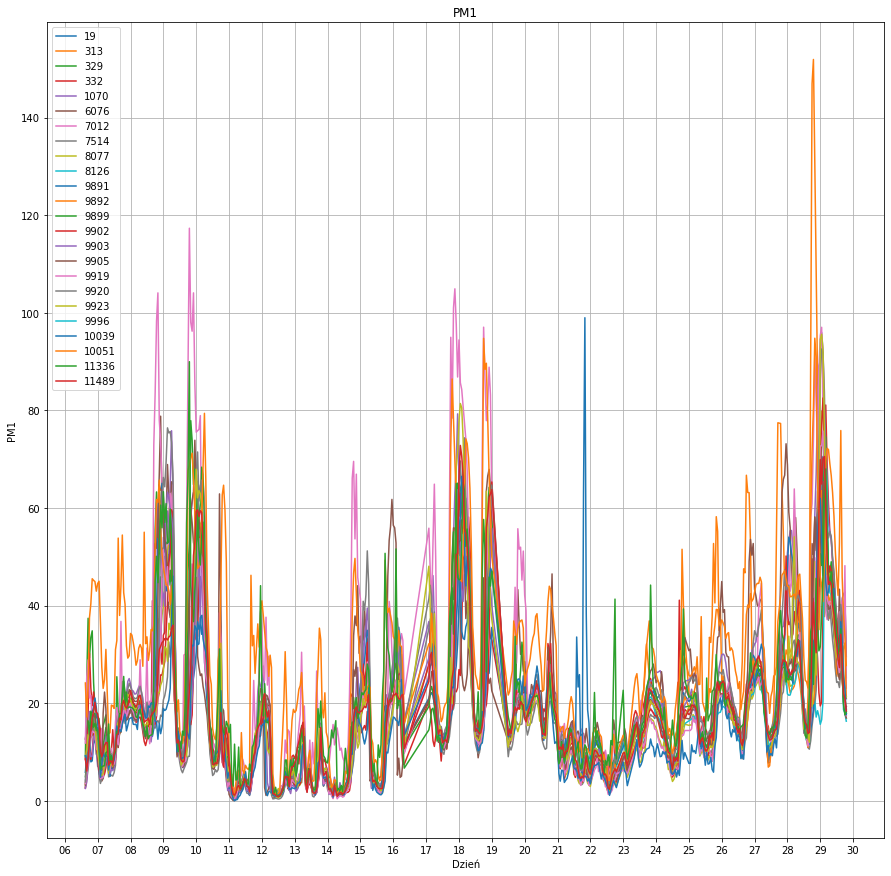

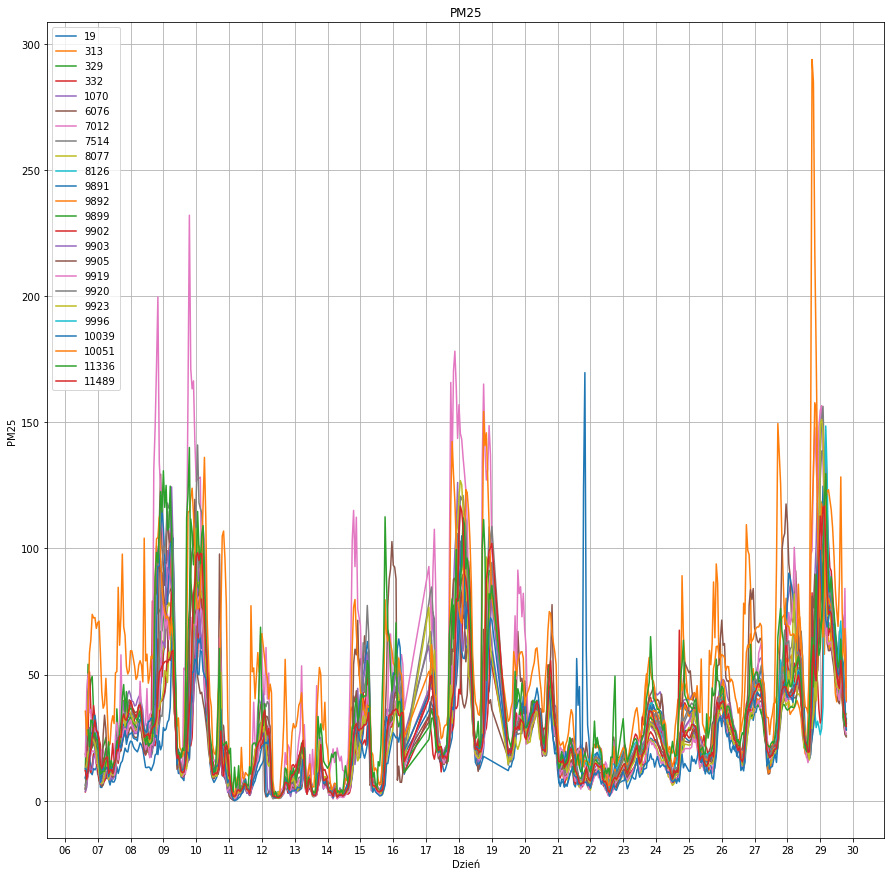

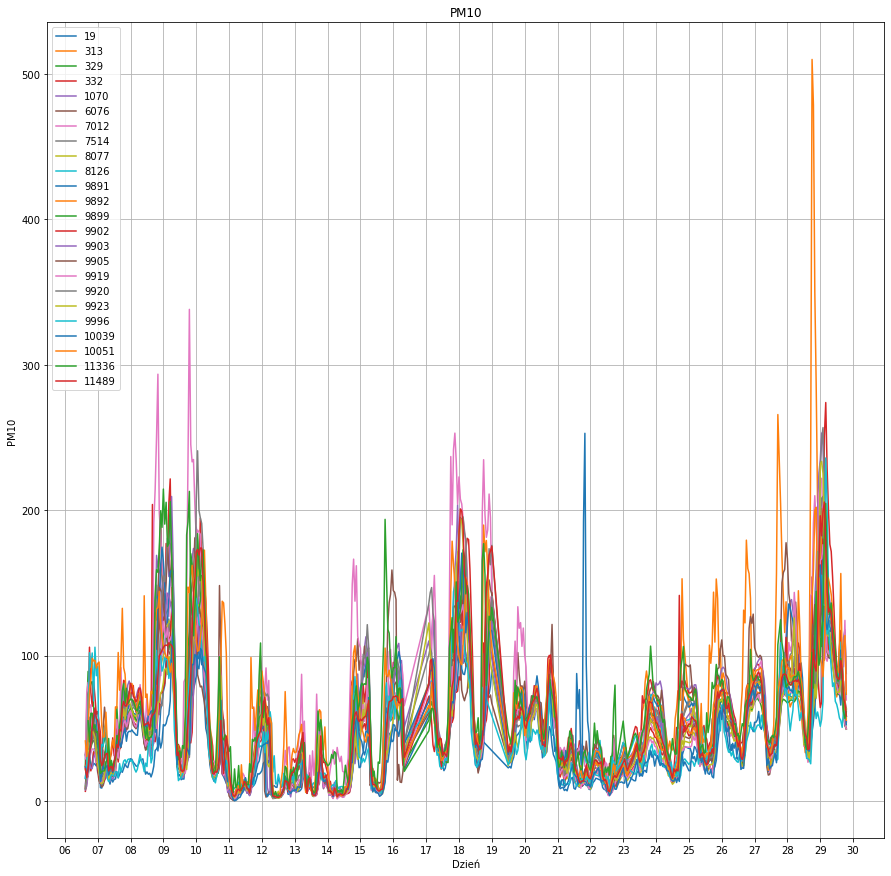

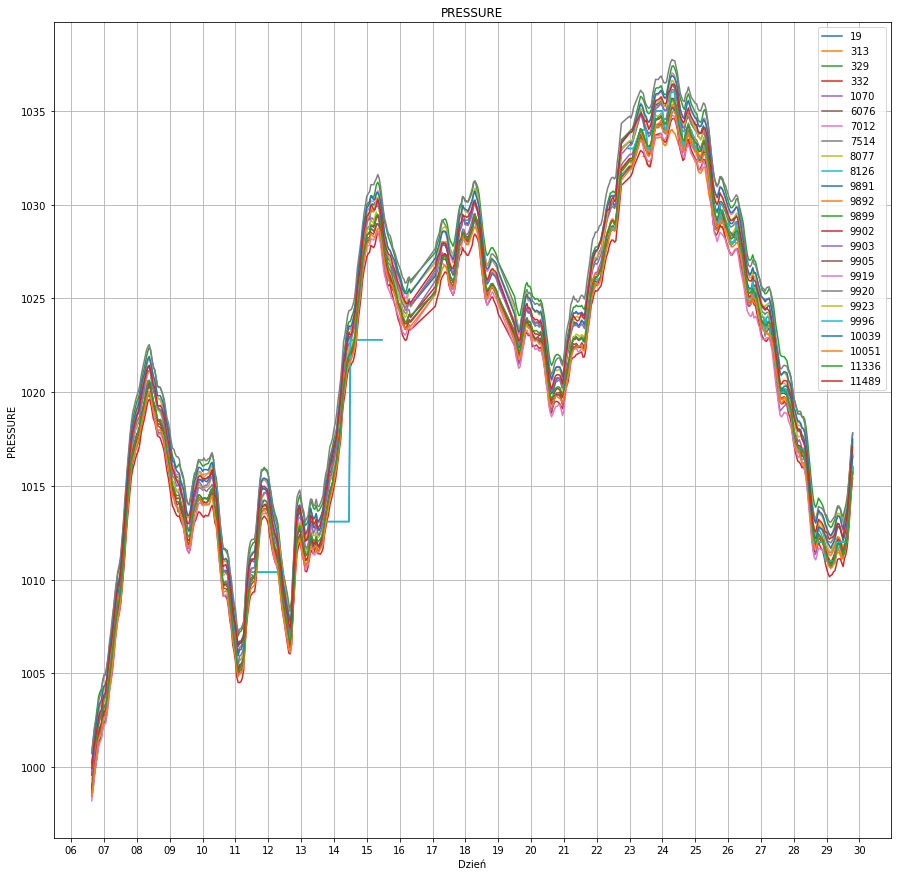

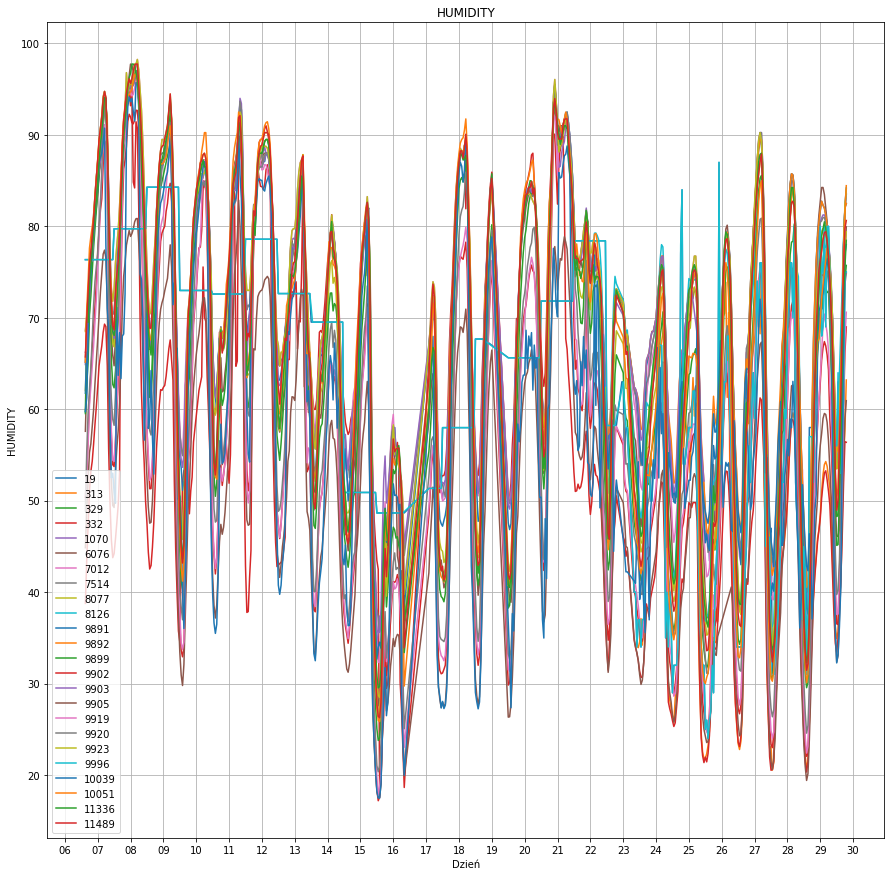

...

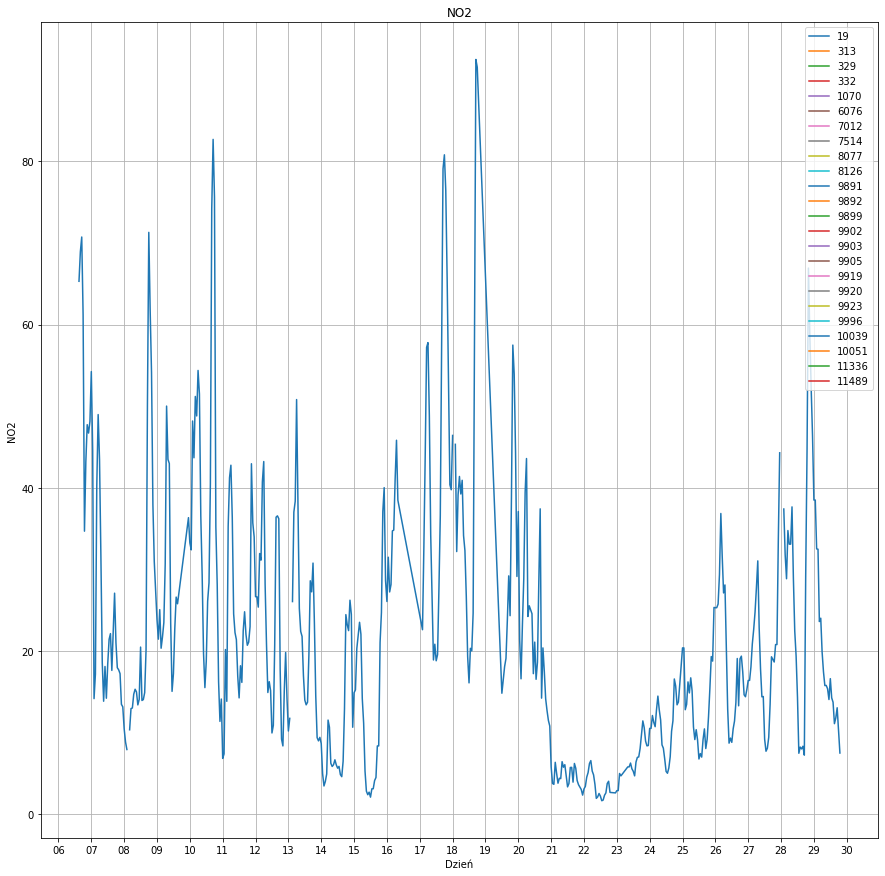

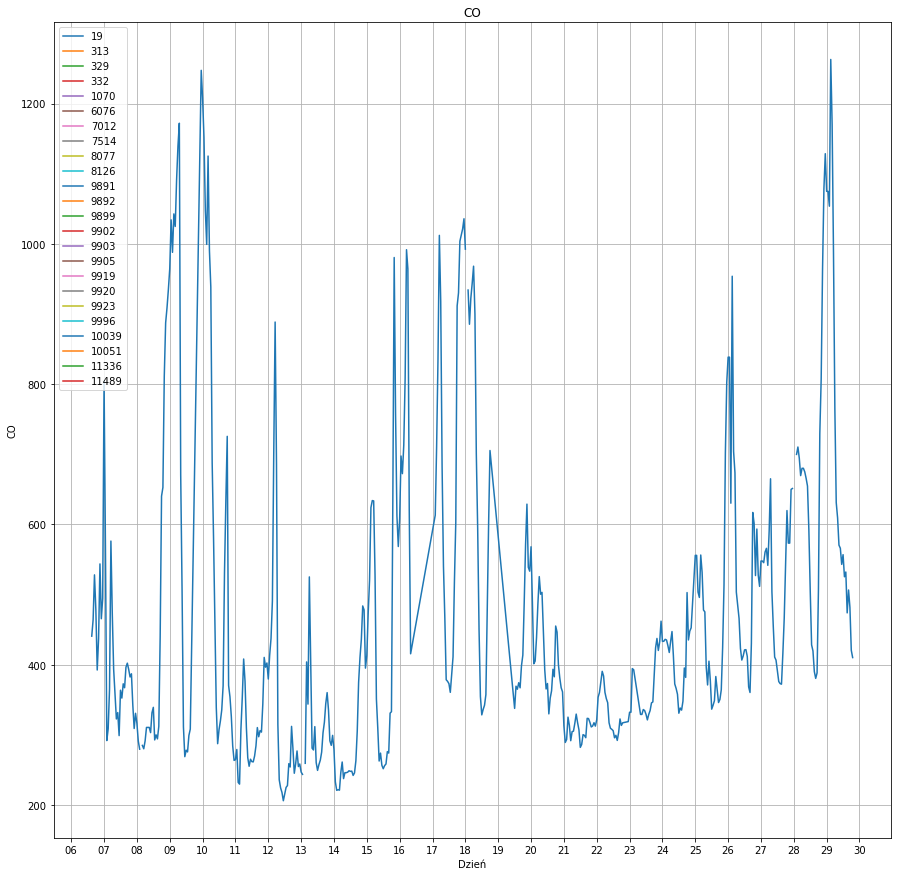

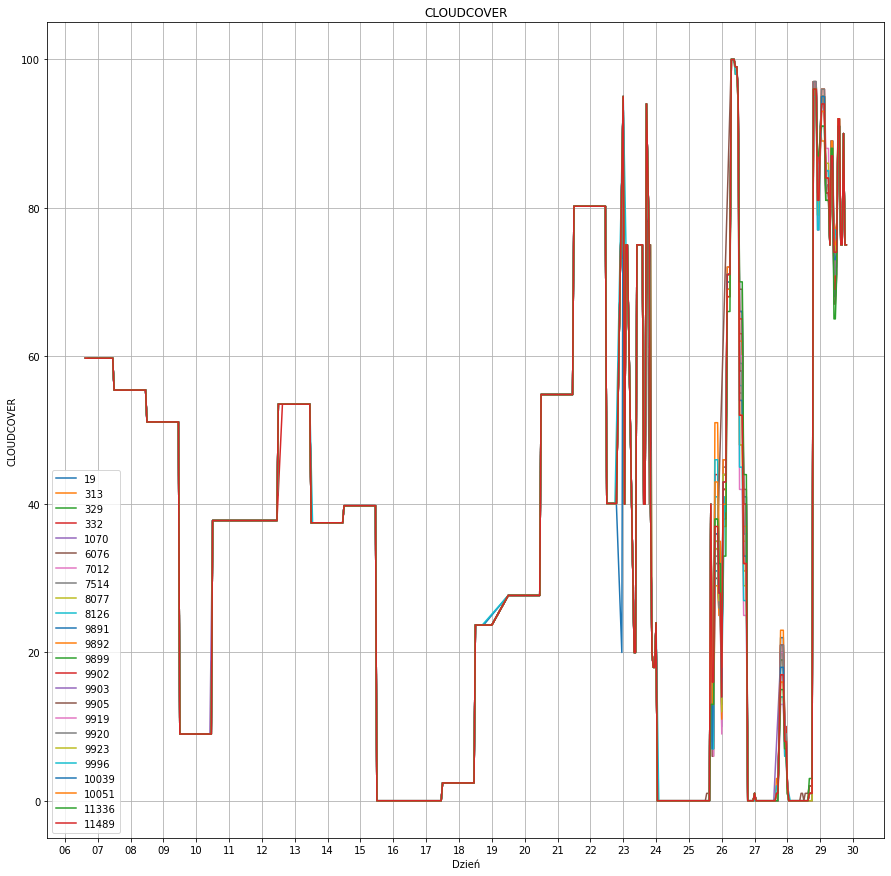

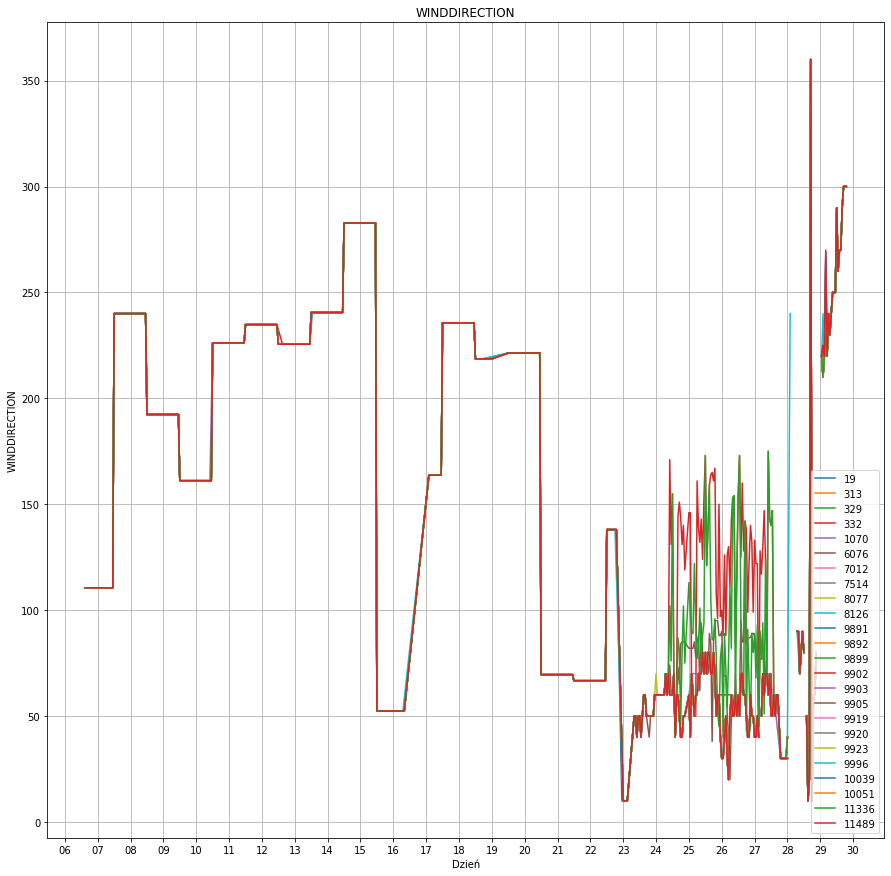

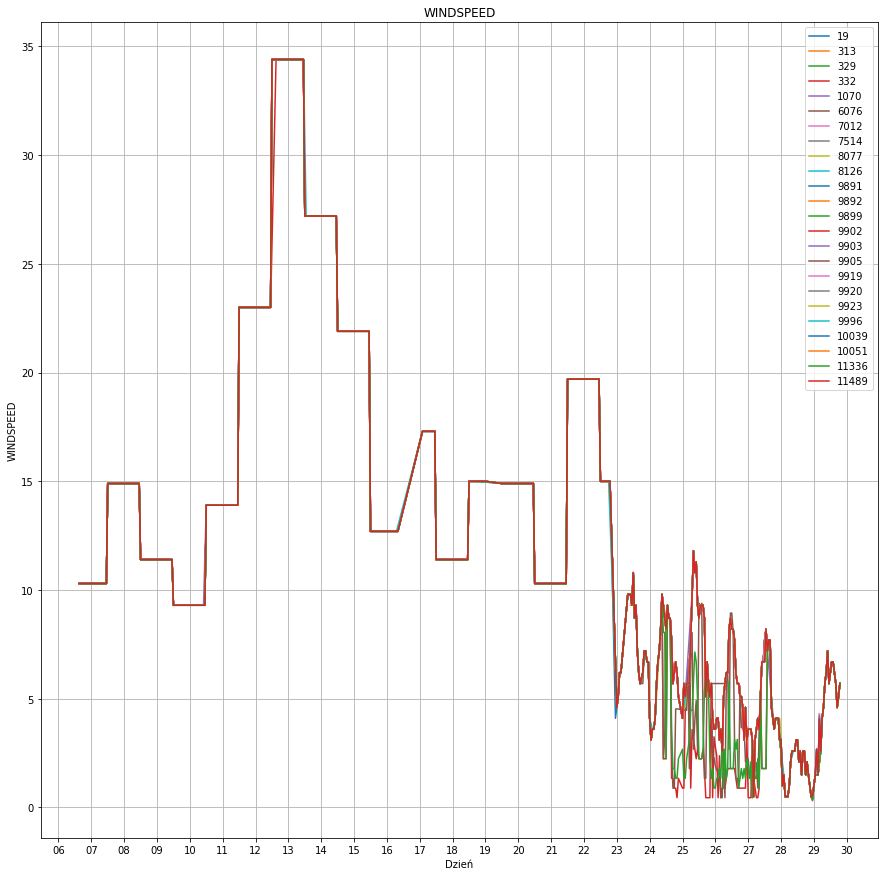

TypeError: 'value' must be an instance of str or bytes, not a NoneType

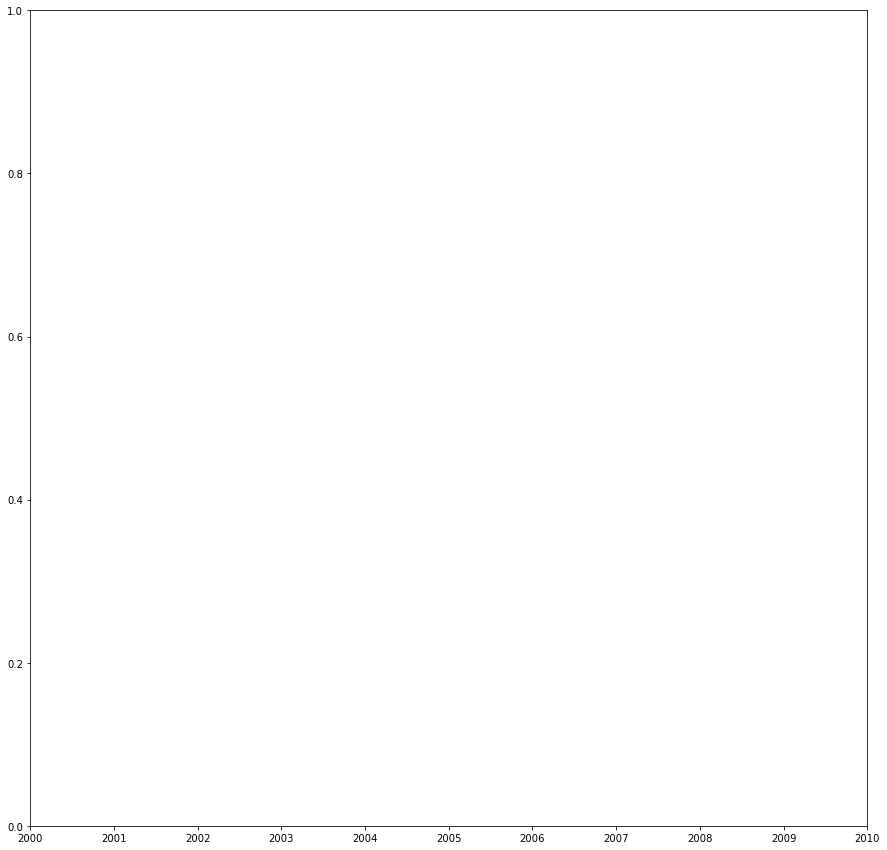

In [72]:
columns_to_plot = np.delete(df.columns.values, (0, 1, 2))
columns_to_plot
for col in columns_to_plot:
    plotAllData(col)

In [82]:
which_measure = 1

def plot_humidity(installation_id):
    measurements = measurements_by_installation_id[installation_id]
    if(measurements['HUMIDITY'].isnull().all()):
        return
    
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%d')

    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(15)
    
    ax.plot(measurements.fromDataTime, measurements['HUMIDITY'], label=installation_id)

    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.grid(True)

    plt.xlabel('Dzień')
    plt.ylabel('Wilgotność [%]')
    plt.title('Wilgotność dla czujnika %d' % (installation_id))

    plot_name = 'HUMIDITY_' + str(installation_id)
    plt.savefig('./plots/%s_%d.png' % (plot_name, which_measure))
    plt.show()

In [74]:
def plot_temperature(installation_id):
    measurements = measurements_by_installation_id[installation_id]
    if(measurements['TEMPERATURE'].isnull().all()):
        return
    
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%d')

    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(15)
    
    ax.plot(measurements.fromDataTime, measurements['TEMPERATURE'], label=installation_id)

    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.grid(True)

    plt.xlabel('Dzień')
    plt.ylabel('Temperatura [C]')
    plt.title('Temperatura dla czujnika %d' % (installation_id))

    plot_name = 'TEMPERATURE_' + str(installation_id)
    plt.savefig('./plots/%s_%d.png' % (plot_name, which_measure))
    plt.show()

## Wykresy temperatury dla każdej stacji

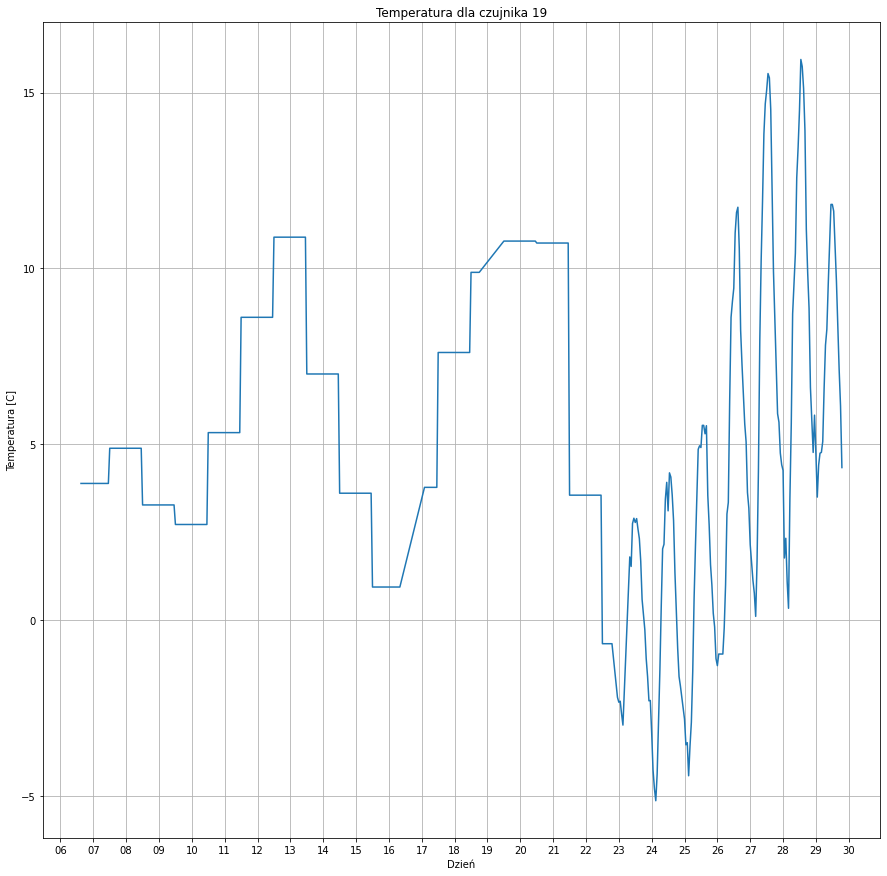

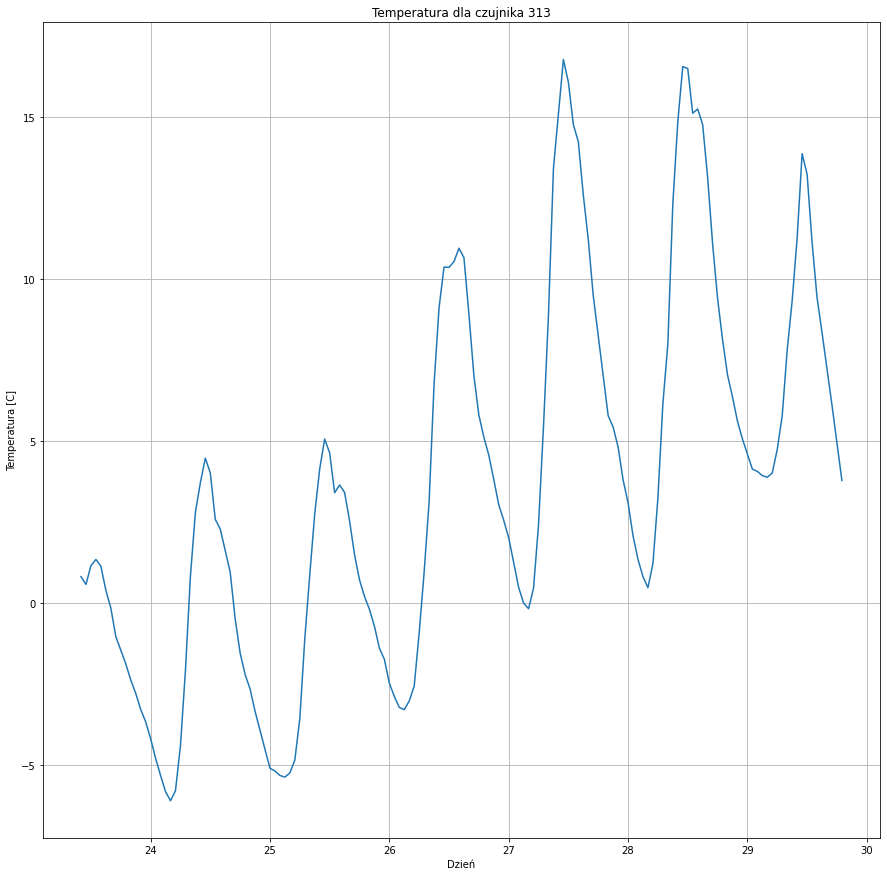

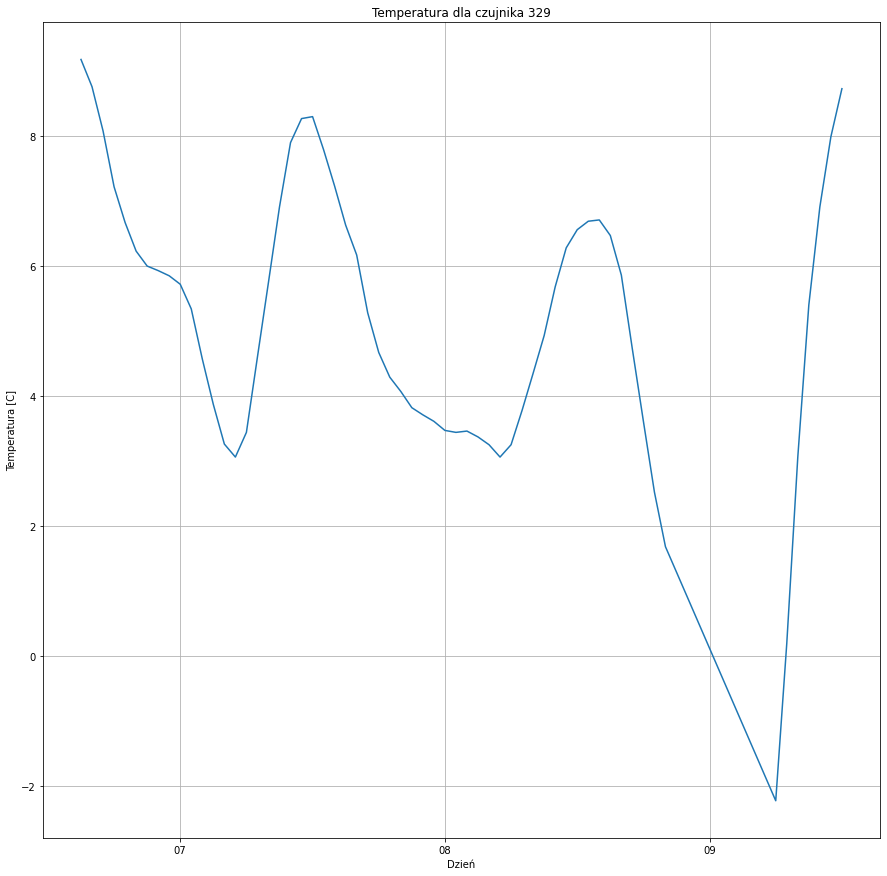

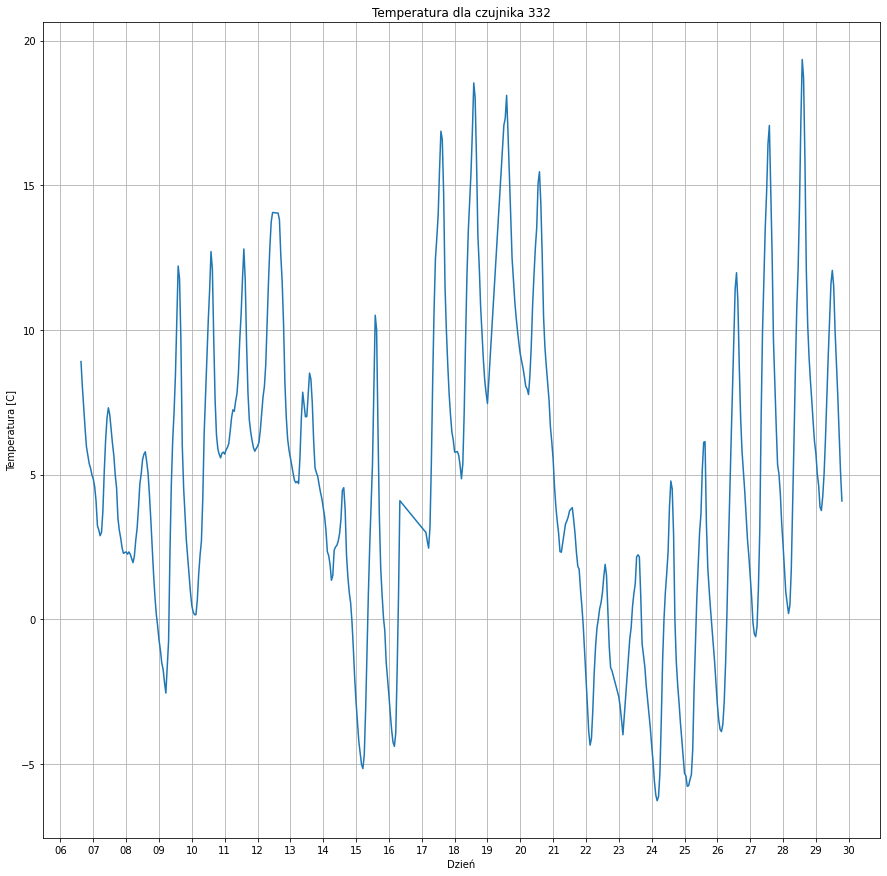

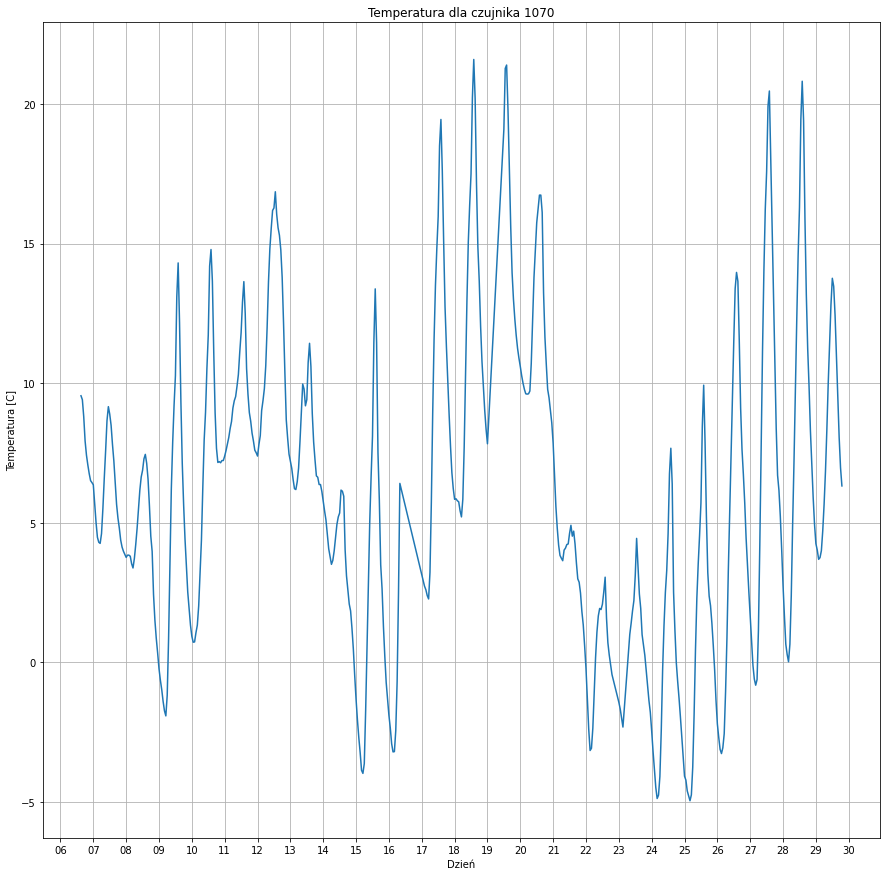

...

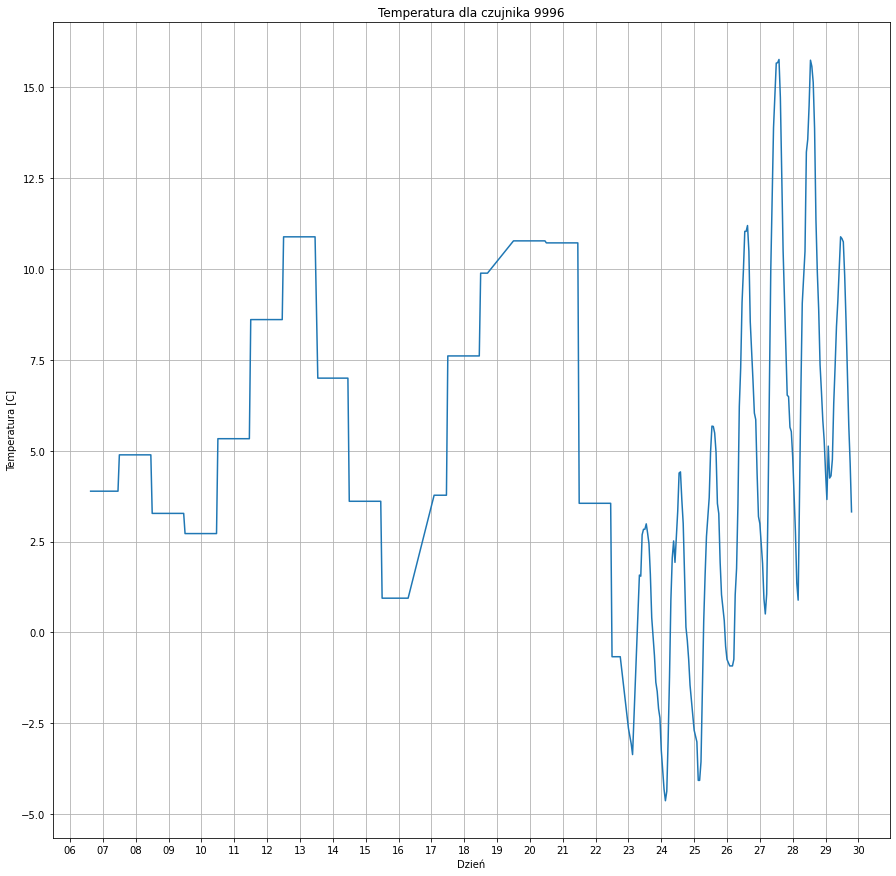

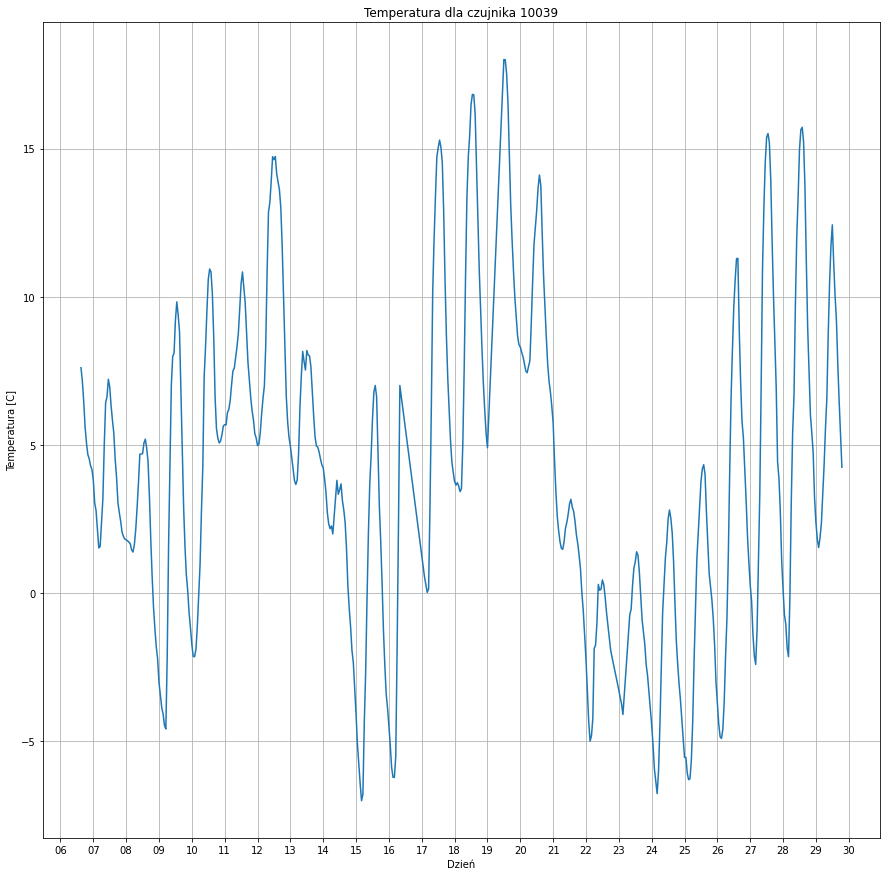

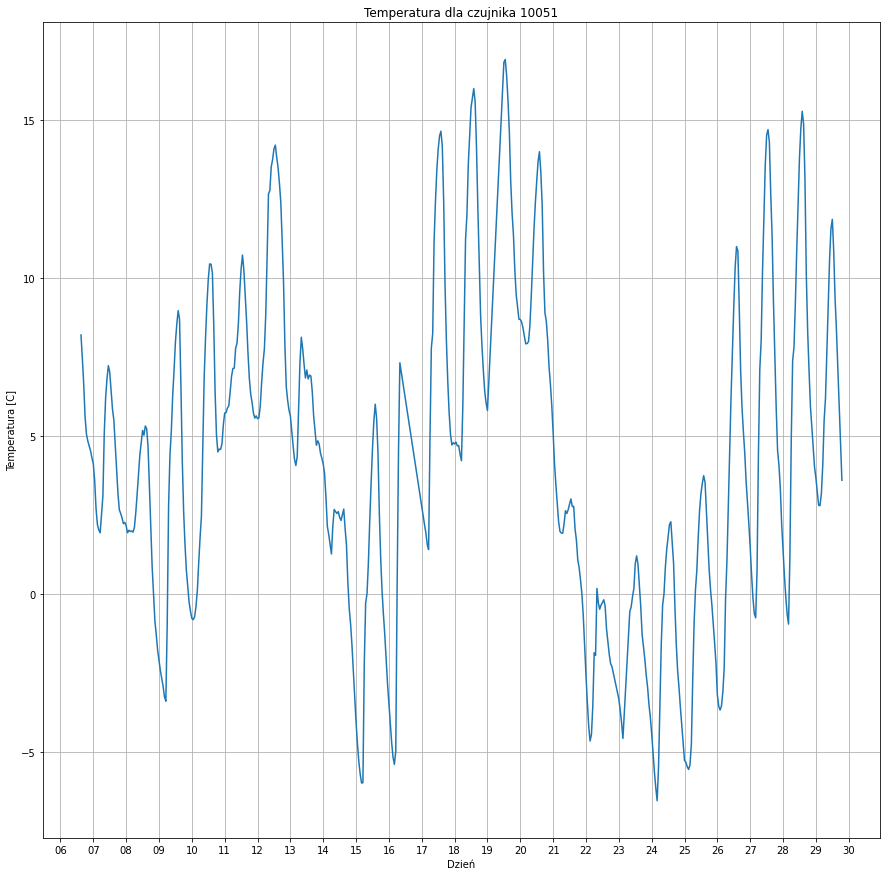

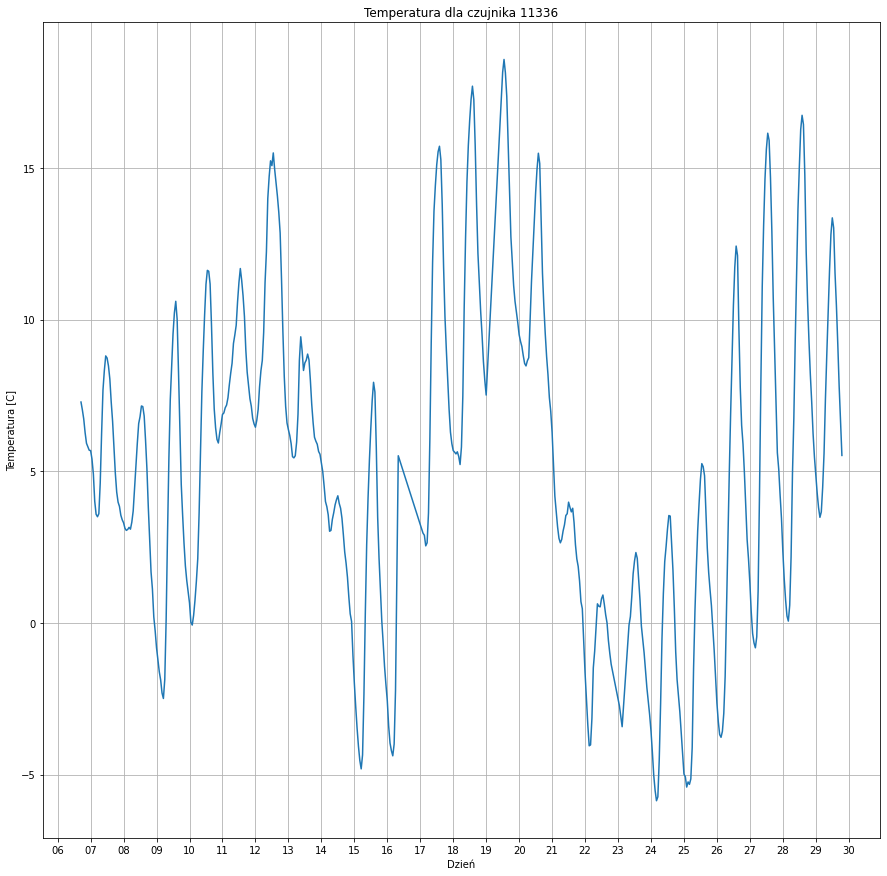

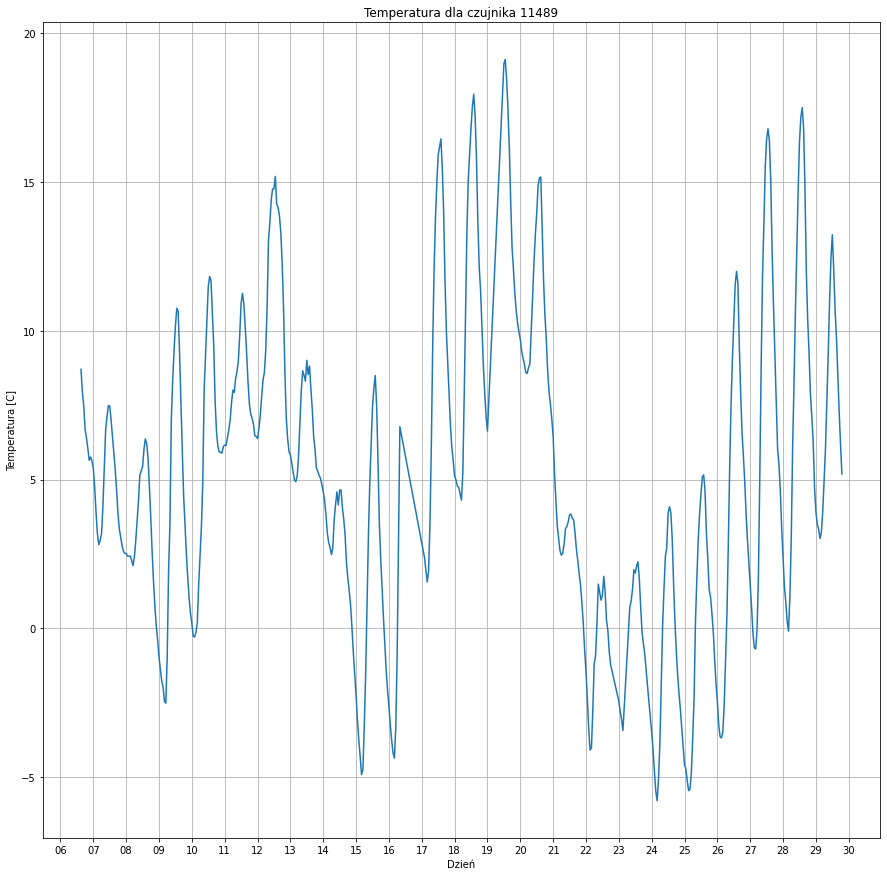

In [76]:
for id in installationd_id:
    plot_temperature(id)

## Wykresy wilgotności dla każdej stacji

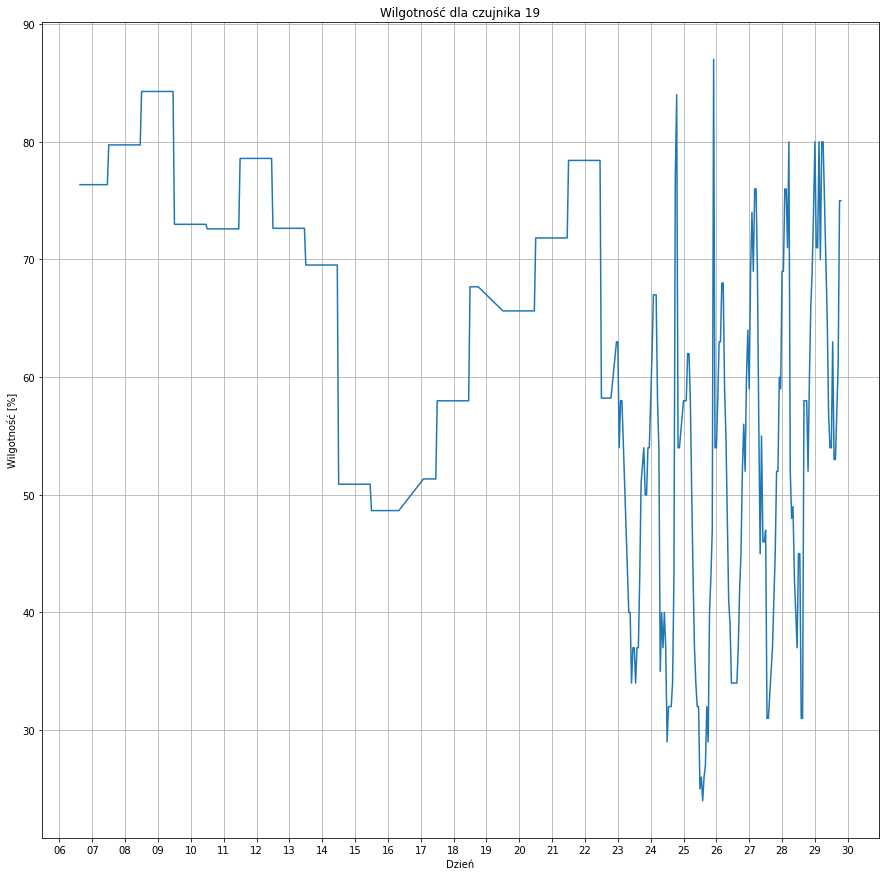

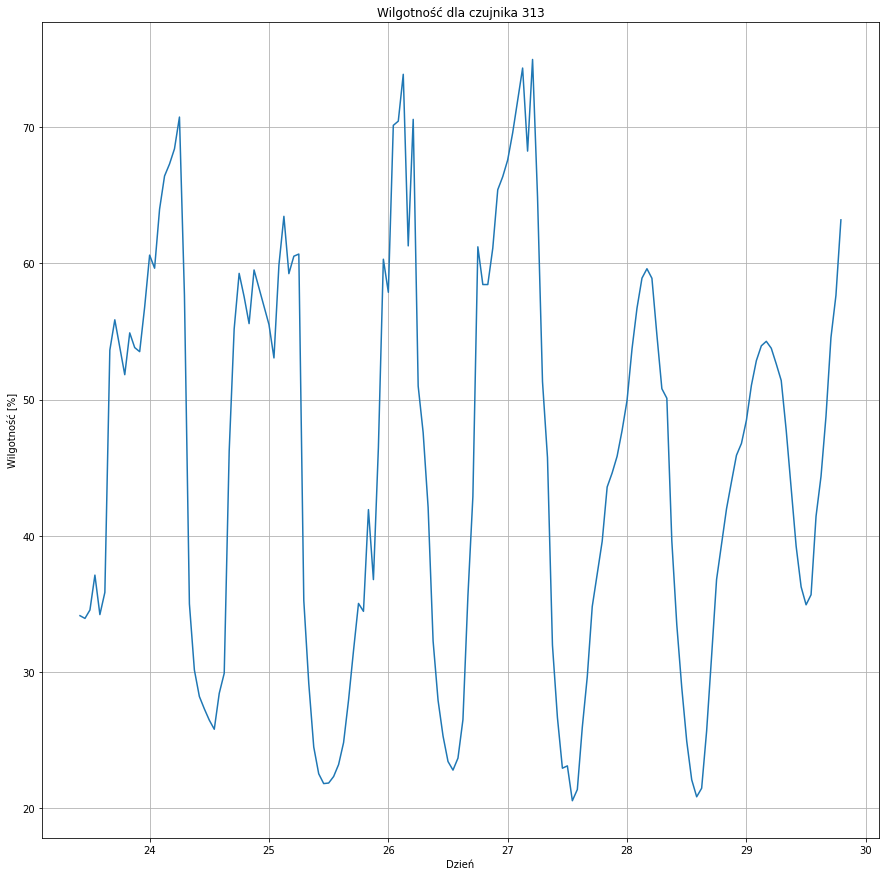

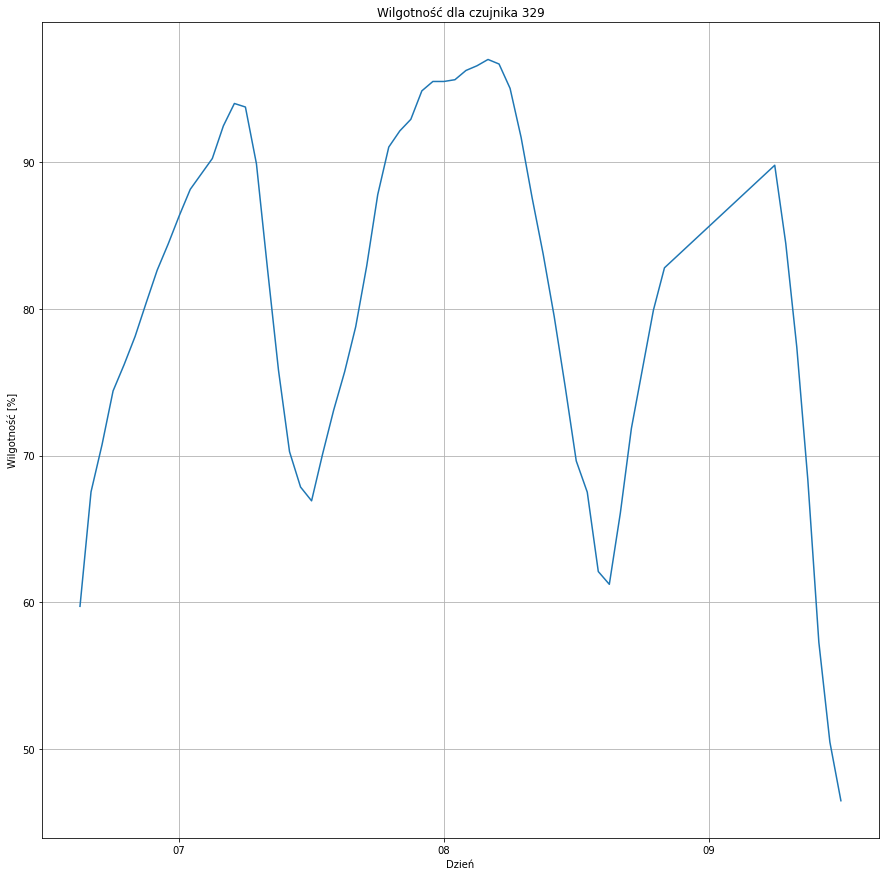

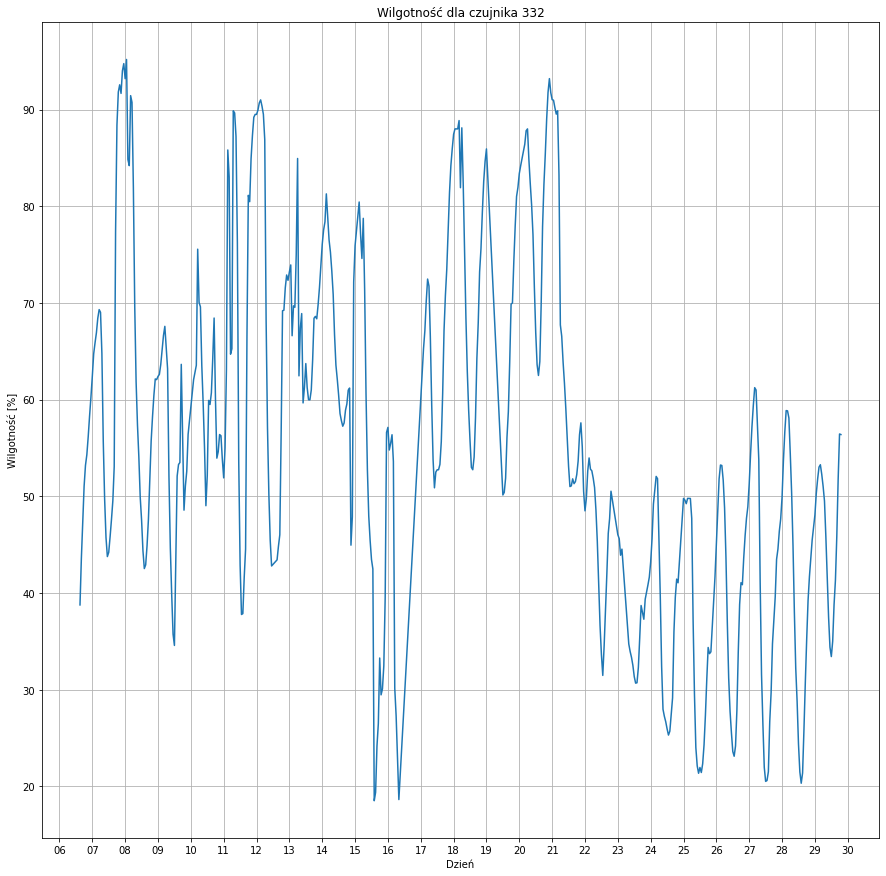

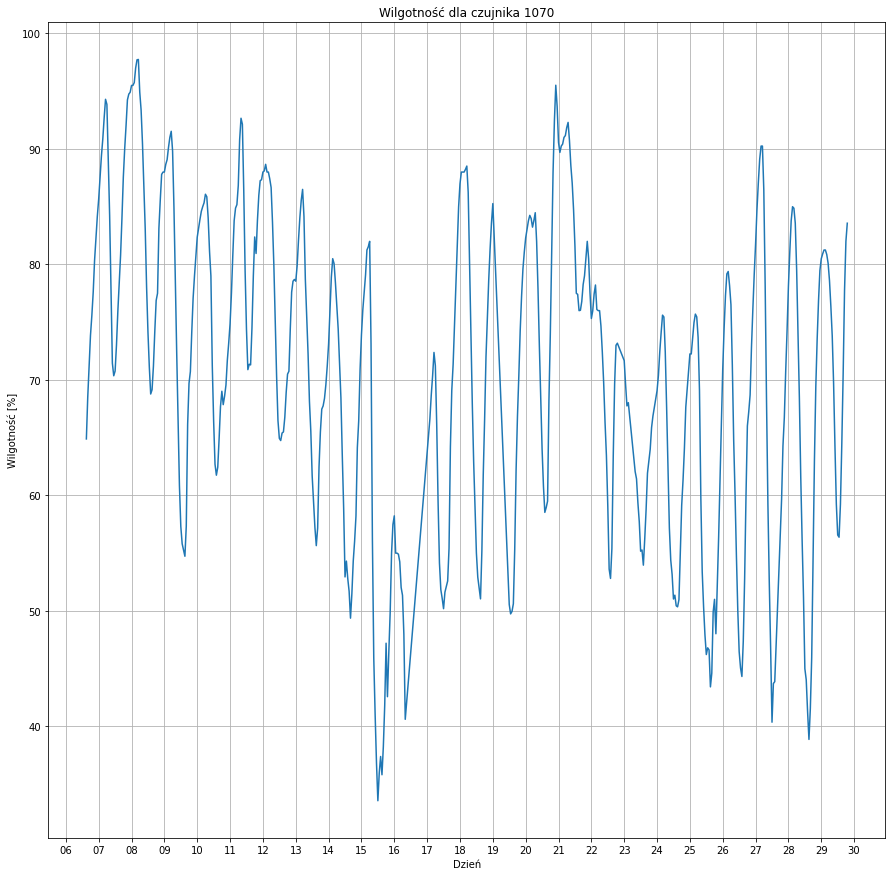

...

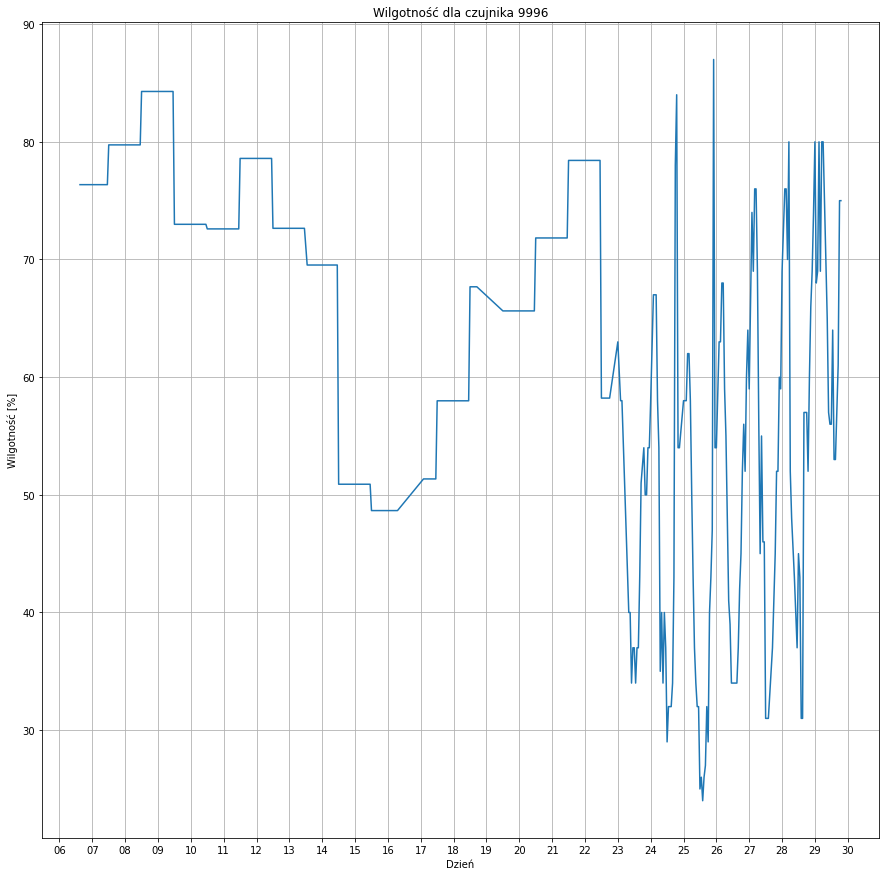

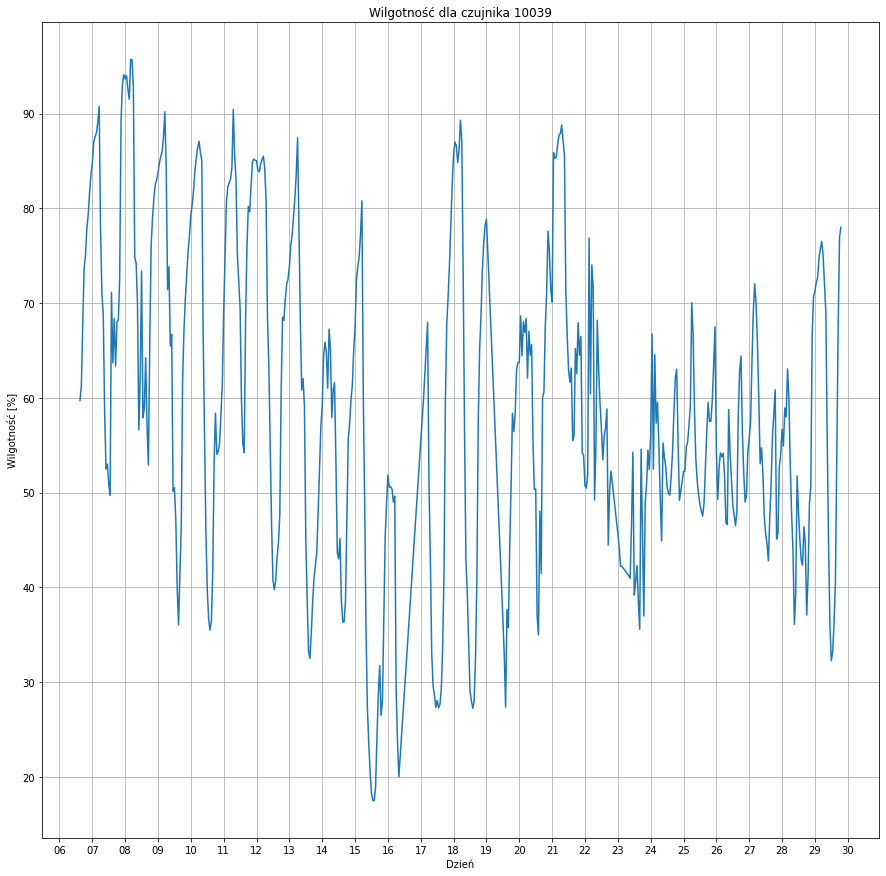

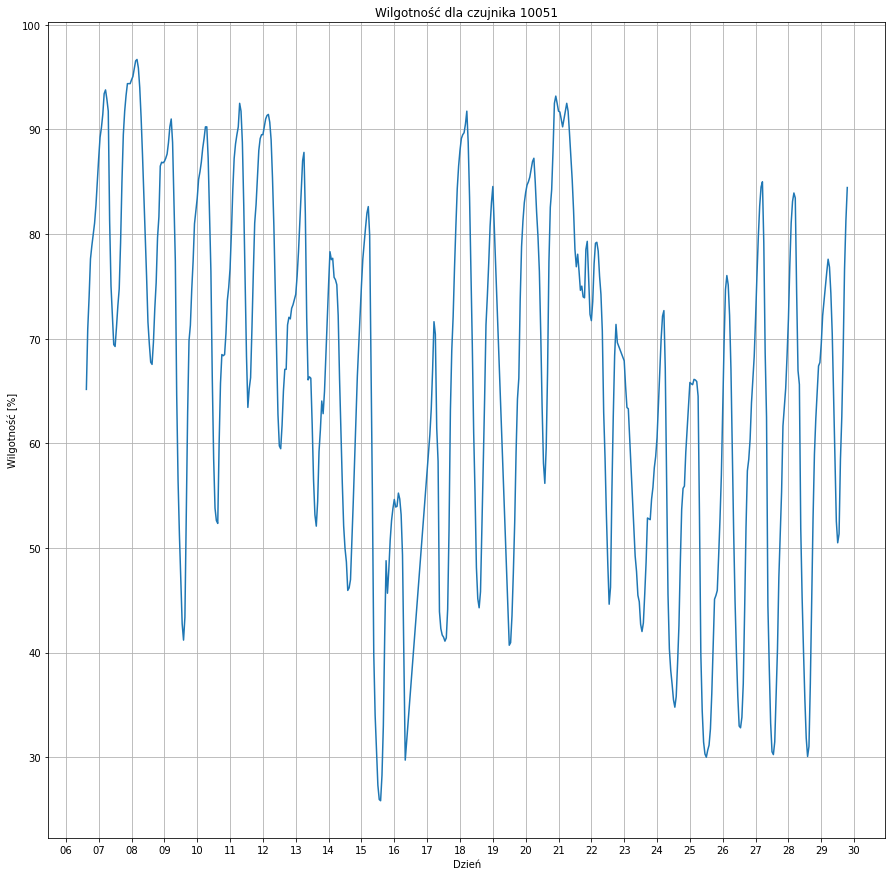

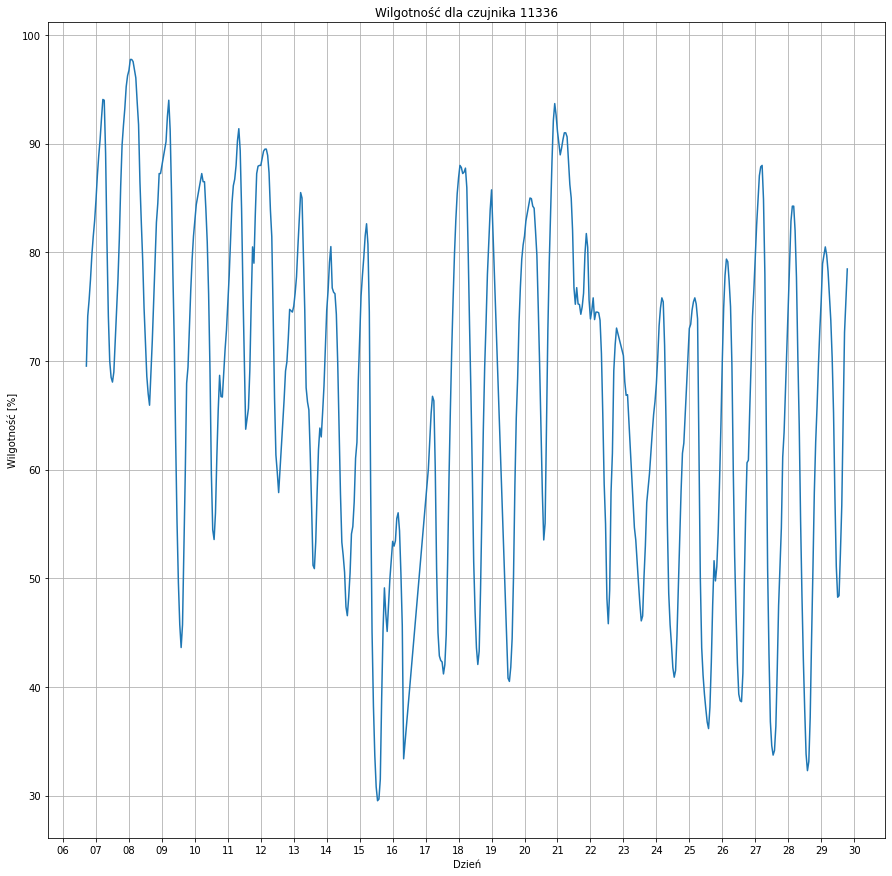

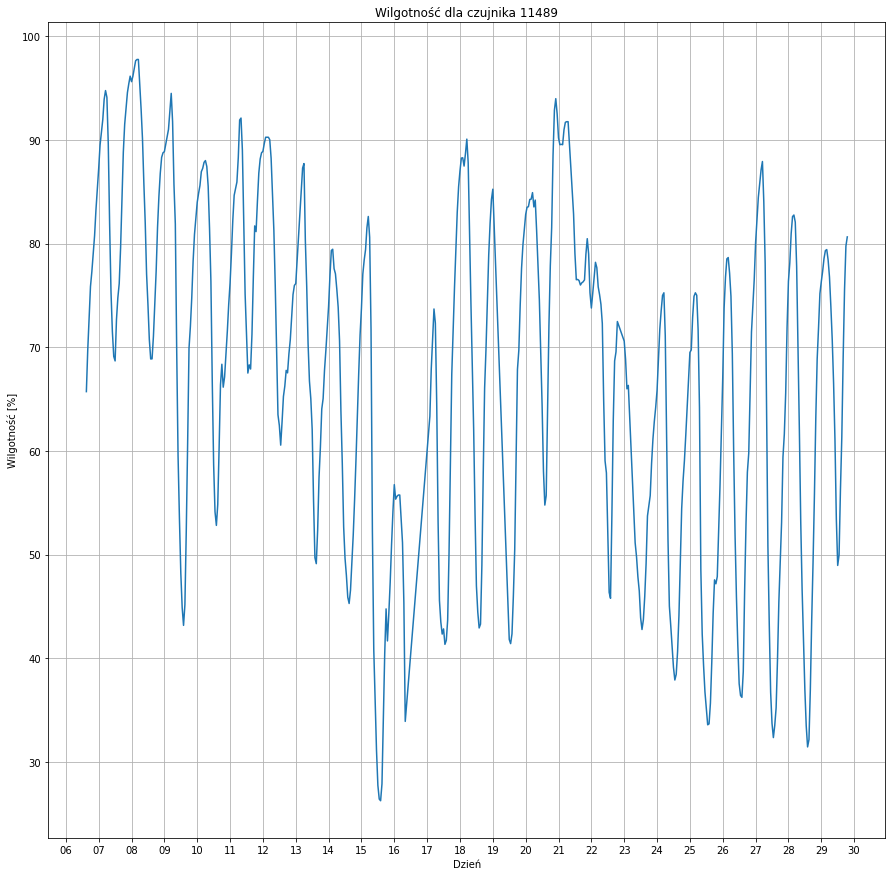

In [78]:
for id in installationd_id:
    plot_humidity(id)

## Przetwarzanie danych

In [79]:
from sklearn import preprocessing

data = df.iloc[:, 3:]
data.corr()

,PM1,PM25,PM10,PRESSURE,HUMIDITY,TEMPERATURE,indexValue,NO2,CO,CLOUDCOVER,WINDDIRECTION,WINDSPEED
PM1,1.000000,0.989727,0.969068,0.005085,0.226937,-0.132041,0.923234,NaN,NaN,-0.081743,0.063678,-0.409437
PM25,0.989727,1.000000,0.982029,-0.012450,0.239204,-0.140546,0.928602,0.353946,0.860996,-0.073392,0.070363,-0.400100
PM10,0.969068,0.982029,1.000000,0.004079,0.230496,-0.155776,0.951868,0.439073,0.878373,-0.088496,0.052125,-0.426463
PRESSURE,0.005085,-0.012450,0.004079,1.000000,-0.309348,-0.443975,0.064298,-0.412334,-0.132880,-0.303242,-0.426179,-0.236426
HUMIDITY,0.226937,0.239204,0.230496,-0.309348,1.000000,-0.205965,0.217905,0.207310,0.010983,0.269240,0.267887,0.154293
TEMPERATURE,-0.132041,-0.140546,-0.155776,-0.443975,-0.205965,1.000000,-0.167127,0.082106,-0.149283,-0.008767,0.336192,0.170384
indexValue,0.923234,0.928602,0.951868,0.064298,0.217905,-0.167127,1.000000,0.434501,0.864685,-0.131061,0.001392,-0.496760
NO2,NaN,0.353946,0.439073,-0.412334,0.207310,0.082106,0.434501,1.000000,0.586928,-0.132220,0.219593,-0.079805
CO,NaN,0.860996,0.878373,-0.132880,0.010983,-0.149283,0.864685,0.586928,1.000000,-0.153021,-0.022072,-0.408485
CLOUDCOVER,-0.081743,-0.073392,-0.088496,-0.303242,0.269240,-0.008767,-0.131061,-0.132220,-0.153021,1.000000,0.140450,0.212414


## Wykres korelacji

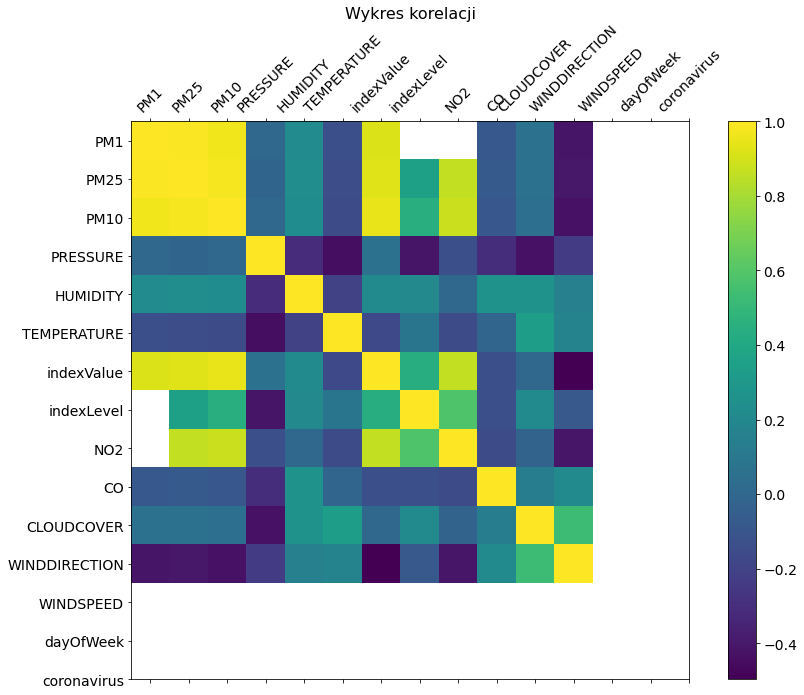

In [80]:
f = plt.figure(figsize=(14, 10))
plt.matshow(data.corr(), fignum=f.number)
plt.xticks(range(data.shape[1]-1), data.columns, fontsize=14, rotation=45)
plt.yticks(range(data.shape[1]-1), data.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Wykres korelacji', fontsize=16, pad=75.0);

## Korelacja pomiędzy temperaturą, wilgotnością a prędkością wiatru

In [15]:
from IPython.display import display, HTML

for id in installationd_id:
    dd = df.loc[df['installationId'] == id][['TEMPERATURE', 'HUMIDITY', 'WINDSPEED']]
    cor = dd.corr()
    print('Czujnik: ' + str(id))
    display(HTML(cor.to_html()))
    print()

Czujnik: 19


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,0.037142,0.287308
HUMIDITY,0.037142,1.000000,0.302325
WINDSPEED,0.287308,0.302325,1.000000



Czujnik: 313


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.671085,-0.031306
HUMIDITY,-0.671085,1.000000,-0.501873
WINDSPEED,-0.031306,-0.501873,1.000000



Czujnik: 329


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.730847,-0.230296
HUMIDITY,-0.730847,1.000000,0.404991
WINDSPEED,-0.230296,0.404991,1.000000



Czujnik: 332


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,0.011391,0.115813
HUMIDITY,0.011391,1.000000,0.458246
WINDSPEED,0.115813,0.458246,1.000000



Czujnik: 1070


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.298686,0.172510
HUMIDITY,-0.298686,1.000000,0.093192
WINDSPEED,0.172510,0.093192,1.000000



Czujnik: 6076


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.341251,0.168984
HUMIDITY,-0.341251,1.000000,0.105794
WINDSPEED,0.168984,0.105794,1.000000



Czujnik: 7012


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.254878,0.182768
HUMIDITY,-0.254878,1.000000,0.128985
WINDSPEED,0.182768,0.128985,1.000000



Czujnik: 7514


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.329956,0.158902
HUMIDITY,-0.329956,1.000000,0.095095
WINDSPEED,0.158902,0.095095,1.000000



Czujnik: 8077


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.224787,0.150959
HUMIDITY,-0.224787,1.000000,0.106158
WINDSPEED,0.150959,0.106158,1.000000



Czujnik: 8126


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.491015,-0.306401
HUMIDITY,-0.491015,1.000000,-0.041417
WINDSPEED,-0.306401,-0.041417,1.000000



Czujnik: 9891


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.334334,0.177344
HUMIDITY,-0.334334,1.000000,0.072790
WINDSPEED,0.177344,0.072790,1.000000



Czujnik: 9892


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.635345,-0.212275
HUMIDITY,-0.635345,1.000000,-0.110270
WINDSPEED,-0.212275,-0.110270,1.000000



Czujnik: 9899


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.186892,0.172001
HUMIDITY,-0.186892,1.000000,0.130221
WINDSPEED,0.172001,0.130221,1.000000



Czujnik: 9902


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.193772,0.146630
HUMIDITY,-0.193772,1.000000,0.159287
WINDSPEED,0.146630,0.159287,1.000000



Czujnik: 9903


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.129687,0.254559
HUMIDITY,-0.129687,1.000000,0.009019
WINDSPEED,0.254559,0.009019,1.000000



Czujnik: 9905


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.208961,0.128029
HUMIDITY,-0.208961,1.000000,0.149636
WINDSPEED,0.128029,0.149636,1.000000



Czujnik: 9919


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.232440,0.139648
HUMIDITY,-0.232440,1.000000,0.148678
WINDSPEED,0.139648,0.148678,1.000000



Czujnik: 9920


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.207376,0.181673
HUMIDITY,-0.207376,1.000000,0.125745
WINDSPEED,0.181673,0.125745,1.000000



Czujnik: 9923


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.239605,0.179693
HUMIDITY,-0.239605,1.000000,0.146966
WINDSPEED,0.179693,0.146966,1.000000



Czujnik: 9996


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,0.028321,0.266490
HUMIDITY,0.028321,1.000000,0.305717
WINDSPEED,0.266490,0.305717,1.000000



Czujnik: 10039


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.294915,0.158752
HUMIDITY,-0.294915,1.000000,0.080176
WINDSPEED,0.158752,0.080176,1.000000



Czujnik: 10051


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.198057,0.142294
HUMIDITY,-0.198057,1.000000,0.171828
WINDSPEED,0.142294,0.171828,1.000000



Czujnik: 11336


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.291514,0.175146
HUMIDITY,-0.291514,1.000000,0.147374
WINDSPEED,0.175146,0.147374,1.000000



Czujnik: 11489


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.299128,0.141511
HUMIDITY,-0.299128,1.000000,0.134522
WINDSPEED,0.141511,0.134522,1.000000


In [31]:
from IPython.display import display, HTML

installations_cor = dict()

for id in installationd_id:
    dd = df.loc[df['installationId'] == id][['TEMPERATURE', 'HUMIDITY', 'WINDSPEED']]
    cor = dd.corr().to_numpy()
    
    
    #tab = "instalacja: " + str(id) + "\n"
    tab = '|| ||= Temperatura =||= Wilgotność =||= Szybkość wiatru =||\n'
    tab += '||= Temperatura =||'
    for i in cor[0]:
        tab += str(i) + "||"
    tab += '\n||= Wilgotność =||'
    for i in cor[1]:
        tab += str(i) + "||"
    tab += '\n||= Szybkość wiatru =||'
    for i in cor[2]:
        tab += str(i) + "||"
    installations_cor[id] = tab

In [90]:
north = [313, 8126, 332, 10051, 329, 9899]
east = [11336, 19, 6076, 9902, 9891, 9903, 9919]
south = [9892, 1070, 7514, 9920, 9905]
west = [7012, 9996, 9923, 11489, 10039, 8077]

pic_number = 1
table_number = 1

def print_station(id):
    global pic_number, table_number
    temp_text = 'Wykres %d: Wykres zależności temperatury od czasu dla czujnika %d' % (pic_number, id)
    pic_number += 1
    hum_text = 'Wykres %d: Wykres zależności wilgotności od czasu dla czujnika %d' % (pic_number, id)
    pic_number += 1
    print("== Czujnik: %d ==" % (id))
    print('[[Image(TEMPERATURE_%d_%d.png, 50%%)]] \\\\ \'\'%s\'\' \\\\' % (id, which_measure, temp_text))
    print('[[Image(HUMIDITY_%d_%d.png, 50%%)]] \\\\ \'\'%s\'\' \\\\' % (id, which_measure, hum_text))
    print()
    print(installations_cor[id])
    print('\'\'Tabela %d: Macierz korelacji pomiędzy temperaturą, wilgotnością a szybkością wiatru dla czujnika %d\'\' \\\\' % (table_number, id))
    table_number += 1
    print("\n")

print("= PÓŁNOC =")
for id in north:
    print_station(id)
    
print('\\\\')
print("= WSCHÓD =")
for id in east:
    print_station(id)

print('\\\\')
print("= POŁUDNIE =")
for id in south:
    print_station(id)

print('\\\\')
print("= ZACHÓD =")
for id in west:
    print_station(id)

= PÓŁNOC =
== Czujnik: 313 ==
[[Image(TEMPERATURE_313_1.png, 50%)]] \\ ''Wykres 1: Wykres zależności temperatury od czasu dla czujnika 313'' \\
[[Image(HUMIDITY_313_1.png, 50%)]] \\ ''Wykres 2: Wykres zależności wilgotności od czasu dla czujnika 313'' \\

|| ||= Temperatura =||= Wilgotność =||= Szybkość wiatru =||
||= Temperatura =||1.0||-0.6710849934923407||-0.031306410596247815||
||= Wilgotność =||-0.6710849934923407||1.0||-0.5018732936858663||
||= Szybkość wiatru =||-0.031306410596247815||-0.5018732936858663||1.0||
''Tabela 1: Macierz korelacji pomiędzy temperaturą, wilgotnością a szybkością wiatru dla czujnika 313'' \\


== Czujnik: 8126 ==
[[Image(TEMPERATURE_8126_1.png, 50%)]] \\ ''Wykres 3: Wykres zależności temperatury od czasu dla czujnika 8126'' \\
[[Image(HUMIDITY_8126_1.png, 50%)]] \\ ''Wykres 4: Wykres zależności wilgotności od czasu dla czujnika 8126'' \\

|| ||= Temperatura =||= Wilgotność =||= Szybkość wiatru =||
||= Temperatura =||1.0||-0.49101499492630407||-0.30640119